%md

###*Pontificia Universidad Javeriana*

**Semestre**: 24-10

**Profesor**: John Corredor, PhD

**Materia**: Procesamiento de Datos a Gran Escala

###**Integrantes**: 

- Juan Sebastian Cordoba Valderrama: Ciencia de Datos

- Samuel Peña Garcia: Ciencia de Datos

- Tomas de Aza Marquez: Ciencia de Datos

In [0]:
##Se importan las librerias a utilizar

from pyspark import SparkContext
from pyspark.sql import *
from pyspark.sql.functions import *
from pyspark.sql.types import *
import pandas as pd
import os

In [0]:
##Se instancia Pyspark
sc = SparkContext.getOrCreate()
sql_sc = SQLContext(sc)
sc

/databricks/spark/python/pyspark/sql/context.py:117: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


<SparkContext master=local[8] appName=Databricks Shell>

In [0]:
from pyspark.sql import SparkSession

# Se inicia una SparkSession
spark = SparkSession.builder \
    .appName("Mi Aplicación") \
    .getOrCreate()


In [0]:
#Se define la ruta a seguir para la extracción de los datos en formato csv
path = 'https://raw.githubusercontent.com/TommyDS2005/Proyecto-Procesamiento-de-Datos/main/NYPD_Arrest_Data__Year_to_Date__20240322.csv'

# Se lee el archivo csv y se almacena en un DataFrame de Pandas definiendo la coma como separador
df = pd.read_csv(path, sep=',')

# Se crea un DataFrame de Spark a partir del DataFrame de Pandas
df = spark.createDataFrame(df)

#Mostrar las primeras 5 filas del df
df.show()

+----------+-----------+-----+--------------------+-----+--------------------+----------+----------+-----------+---------------+-----------------+---------+--------+---------+----------+----------+----------------+-----------------+------------------------+
|ARREST_KEY|ARREST_DATE|PD_CD|             PD_DESC|KY_CD|           OFNS_DESC|  LAW_CODE|LAW_CAT_CD|ARREST_BORO|ARREST_PRECINCT|JURISDICTION_CODE|AGE_GROUP|PERP_SEX|PERP_RACE|X_COORD_CD|Y_COORD_CD|        Latitude|        Longitude|New Georeferenced Column|
+----------+-----------+-----+--------------------+-----+--------------------+----------+----------+-----------+---------------+-----------------+---------+--------+---------+----------+----------+----------------+-----------------+------------------------+
| 261265483| 01/03/2023|397.0|ROBBERY,OPEN AREA...|105.0|             ROBBERY|PL 1600500|         F|          B|             49|                0|    18-24|       M|    BLACK|   1027430|    251104|       40.855793|       -73.8

In [0]:
##Se imprimen los tipos de datos.
df.printSchema()

root
 |-- ARREST_KEY: long (nullable = true)
 |-- ARREST_DATE: string (nullable = true)
 |-- PD_CD: double (nullable = true)
 |-- PD_DESC: string (nullable = true)
 |-- KY_CD: double (nullable = true)
 |-- OFNS_DESC: string (nullable = true)
 |-- LAW_CODE: string (nullable = true)
 |-- LAW_CAT_CD: string (nullable = true)
 |-- ARREST_BORO: string (nullable = true)
 |-- ARREST_PRECINCT: long (nullable = true)
 |-- JURISDICTION_CODE: long (nullable = true)
 |-- AGE_GROUP: string (nullable = true)
 |-- PERP_SEX: string (nullable = true)
 |-- PERP_RACE: string (nullable = true)
 |-- X_COORD_CD: long (nullable = true)
 |-- Y_COORD_CD: long (nullable = true)
 |-- Latitude: double (nullable = true)
 |-- Longitude: double (nullable = true)
 |-- New Georeferenced Column: string (nullable = true)




###Significado de cada atributo

ARREST_KEY: Identificador único y persistente generado aleatoriamente para cada arresto. Tipo de dato texto plano.

ARREST_DATE: Fecha exacta del arresto del evento reportado. Tipo de dato fecha y hora.

PD_CD: Código de clasificación interna de tres dígitos (más detallado que el Código Clave). Tipo de dato número.

PD_DESC: Descripción de la clasificación interna que corresponde con el código PD (más detallada que la Descripción de la Ofensa). Tipo de dato texto plano.

KY_CD: Código de clasificación interna de tres dígitos (categoría más general que el código PD). Tipo de dato número.

OFNS_DESC: Descripción de la clasificación interna que corresponde con el código KY (categoría más general que la descripción PD). Tipo de dato texto plano.

LAW_CODE: Códigos de la ley correspondientes al Código Penal de Nueva York, VTL y otras leyes locales diversas. Tipo de dato texto plano.

LAW_CAT_CD: Nivel del delito: delito mayor (felony), delito menor (misdemeanor), infracción (violation). Tipo de dato texto plano.

ARREST_BORO: Barrio del arresto. B (Bronx), S (Staten Island), K (Brooklyn), M (Manhattan), Q (Queens). Tipo de dato texto plano.

ARREST_PRECINCT: Precinto donde ocurrió el arresto. Tipo de dato número.

JURISDICTION_CODE: Código de jurisdicción responsable del arresto. Los códigos de jurisdicción 0 (Patrulla), 1 (Tránsito) y 2 (Vivienda) representan al NYPD, mientras que los códigos 3 en adelante representan jurisdicciones ajenas al NYPD. Tipo de dato número.

AGE_GROUP: Edad del perpetrador dentro de una categoría establecida. Tipo de dato texto plano.

PERP_SEX: Descripción del sexo del perpetrador. Tipo de dato texto plano.

PERP_RACE: Descripción de la raza del perpetrador. Tipo de dato texto plano.

X_COORD_CD: Coordenada X del punto medio de la cuadra para el Sistema de Coordenadas Planas del Estado de Nueva York, Zona de Long Island, NAD 83, unidades en pies (FIPS 3104). Tipo de dato número.

Y_COORD_CD: Coordenada Y del punto medio de la cuadra para el Sistema de Coordenadas Planas del Estado de Nueva York, Zona de Long Island, NAD 83, unidades en pies (FIPS 3104). Tipo de dato número.

Latitude: Coordenada de latitud para el Sistema de Coordenadas Global, WGS 1984, grados decimales (EPSG 4326). Tipo de dato número.

Longitude: Coordenada de longitud para el Sistema de Coordenadas Global, WGS 1984, grados decimales (EPSG 4326). Tipo de dato número.


###Descripción del dataset

Este conjunto de datos contiene registros detallados de arrestos efectuados por el Departamento de Policía de Nueva York (NYPD) durante el año en curso, incluyendo información demográfica del detenido, el tipo de delito, la ubicación exacta y la fecha del arresto, así como el código y descripción de la ley asociada con el arresto.


%md
###Exploración de datos

In [0]:
#Se imprimen las dimensiones del conjunto de datos
print("El conjunto de datos cuenta con " + str(df.count()) + " filas y " + str(len(df.columns)) + " columnas")

El conjunto de datos cuenta con 226872 filas y 19 columnas


In [0]:
#Se hace un resumen estadístico de la información
display(df.describe())

summary,ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,New Georeferenced Column
count,226872,226872,226870,226872,226855,226872,226872,225273,226872,226872,226872,226872,226872,226872,226872,226872,226872,226872,226872
mean,2.706479248400111E8,null,424.7544011989245,null,249.3451323532653,null,null,9.0,null,63.43052910892486,0.9285367960788462,null,null,null,1005786.7287192778,208289.0843206742,40.73815365744051,-73.92191484770173,null
stddev,5304010.298148704,null,274.4753806048602,null,147.68673264760514,null,null,0.0,null,34.63504525700397,7.538568508006559,null,null,null,21509.43764815173,29744.71887264727,0.11823655424556391,0.17333780170454197,null
min,261180920,01/01/2023,1.0,(null),101.0,(null),(null),(null),B,1,0,18-24,F,AMERICAN INDIAN/ALASKAN NATIVE,0,0,0.0,-74.253256,POINT (-73.70059684703173 40.7390218775969)
max,279779734,12/31/2023,997.0,"WEAPONS,MFR,TRANSPORT,ETC.",995.0,VEHICLE AND TRAFFIC LAWS,VTL21300A5,V,S,123,97,<18,U,WHITE HISPANIC,1067220,271819,40.912714,0.0,POINT (0 0)


In [0]:
#Se hace una primera revisión de los datos haciendo una leve transformación al tipo de dato de la columna ARREST_DATE
dfdtm = df.withColumn("ARREST_DATE", to_date(col("ARREST_DATE"), "MM/dd/yyyy"))
display(dfdtm)

ARREST_KEY,ARREST_DATE,PD_CD,PD_DESC,KY_CD,OFNS_DESC,LAW_CODE,LAW_CAT_CD,ARREST_BORO,ARREST_PRECINCT,JURISDICTION_CODE,AGE_GROUP,PERP_SEX,PERP_RACE,X_COORD_CD,Y_COORD_CD,Latitude,Longitude,New Georeferenced Column
261265483,2023-01-03,397.0,"ROBBERY,OPEN AREA UNCLASSIFIED",105.0,ROBBERY,PL 1600500,F,B,49,0,18-24,M,BLACK,1027430,251104,40.855793,-73.843908,POINT (-73.843908 40.855793)
261271301,2023-01-03,105.0,STRANGULATION 1ST,106.0,FELONY ASSAULT,PL 1211200,F,S,120,0,25-44,M,WHITE,962808,174275,40.644996,-74.077263,POINT (-74.077263 40.644996)
261336449,2023-01-04,397.0,"ROBBERY,OPEN AREA UNCLASSIFIED",105.0,ROBBERY,PL 1601001,F,K,61,0,<18,M,BLACK,995118,155708,40.594054,-73.960866,POINT (-73.960866 40.594054)
261328047,2023-01-04,105.0,STRANGULATION 1ST,106.0,FELONY ASSAULT,PL 1211200,F,Q,114,0,18-24,M,BLACK,1007694,219656,40.769552,-73.915361,POINT (-73.915361 40.769552)
261417496,2023-01-05,244.0,"BURGLARY,UNCLASSIFIED,UNKNOWN",107.0,BURGLARY,PL 1402000,F,B,44,0,25-44,F,BLACK,1007174,239542,40.824135,-73.91717,POINT (-73.91717 40.824135)
261583093,2023-01-08,109.0,"ASSAULT 2,1,UNCLASSIFIED",106.0,FELONY ASSAULT,PL 1200502,F,K,76,0,25-44,M,BLACK,984110,188363,40.683691,-74.000504,POINT (-74.000504 40.683691)
261611504,2023-01-09,263.0,"ARSON 2,3,4",114.0,ARSON,PL 1501500,F,B,49,71,25-44,M,WHITE,1028555,246897,40.84424,-73.839868,POINT (-73.839868 40.84424)
261892107,2023-01-14,109.0,"ASSAULT 2,1,UNCLASSIFIED",106.0,FELONY ASSAULT,PL 1200501,F,K,90,0,25-44,M,BLACK,996541,199439,40.714082,-73.955662,POINT (-73.955662 40.714082)
261926460,2023-01-14,263.0,"ARSON 2,3,4",114.0,ARSON,PL 1501001,F,K,63,0,25-44,M,BLACK,1000520,168264,40.628508,-73.941384,POINT (-73.941384 40.628508)
262973934,2023-02-03,105.0,STRANGULATION 1ST,106.0,FELONY ASSAULT,PL 1211200,F,M,34,0,25-44,M,BLACK,1003818,253167,40.861538,-73.929256,POINT (-73.929256 40.861538)


In [0]:
#Se realiza una agrupación de los datos por año y trimestre para conocer la cantidad de arrestos por trimestre

crimes_by_quarter = df.withColumn("Year", year(col("ARREST_DATE")))
crimes_by_quarter = crimes_by_quarter.withColumn("Quarter", quarter(col("ARREST_DATE")))

crimes_by_quarter = crimes_by_quarter.groupBy("Year", "Quarter").count()

display(crimes_by_quarter.orderBy("Quarter"))

Year,Quarter,count
null,null,226872


In [0]:
#Se crea un dataframe con la cantidad de arrestos por delito

crime_count_by_description = df.groupBy("OFNS_DESC").count().orderBy(col("count").desc())

#Se crea un diccionario con las traducciones de los delitos para facilitar el entendimiento de la información
translations = {
    "ASSAULT 3 & RELATED OFFENSES": "Asalto grado 3 y delitos relacionados",
    "PETIT LARCENY": "Hurto menor",
    "FELONY ASSAULT": "Asalto grave",
    "DANGEROUS DRUGS": "Drogas peligrosas",
    "MISCELLANEOUS PENAL LAW": "Ley penal miscelánea",
    "VEHICLE AND TRAFFIC LAWS": "Leyes de tráfico y vehículos",
    "ROBBERY": "Robo",
    "CRIMINAL MISCHIEF & RELATED OF": "Vandalismo y delitos relacionados",
    "GRAND LARCENY": "Hurto mayor",
    "DANGEROUS WEAPONS": "Armas peligrosas"
}

#Se crea una función para traducir los delitos
def translate_crime(column):
    translated_column = when(col(column).isNull(), "")
    for eng_desc, spa_desc in translations.items():
        translated_column = translated_column.when(col(column) == eng_desc, spa_desc)
    return translated_column.otherwise(col(column))

#Se aplica la función de traducción al dataframe
crime_count_by_description = crime_count_by_description.withColumn("Crimen", translate_crime("OFNS_DESC"))

#Se muestran los 10 delitos más comunes
display(crime_count_by_description.limit(10))

OFNS_DESC,count,Crimen
ASSAULT 3 & RELATED OFFENSES,33839,Asalto grado 3 y delitos relacionados
PETIT LARCENY,23888,Hurto menor
FELONY ASSAULT,21121,Asalto grave
DANGEROUS DRUGS,15701,Drogas peligrosas
MISCELLANEOUS PENAL LAW,14862,Ley penal miscelánea
VEHICLE AND TRAFFIC LAWS,12443,Leyes de tráfico y vehículos
ROBBERY,11071,Robo
CRIMINAL MISCHIEF & RELATED OF,11012,Vandalismo y delitos relacionados
GRAND LARCENY,10666,Hurto mayor
DANGEROUS WEAPONS,9613,Armas peligrosas


In [0]:
# Assuming df has a column named "ARREST_DATE" from which we can extract the Year and Quarter
crime_counts_by_type_and_quarter = df.withColumn("Year", year(col("ARREST_DATE"))) \
                                     .withColumn("Quarter", quarter(col("ARREST_DATE")))

# Group by offense description, Year, and Quarter, then count the occurrences
crime_counts_by_type_and_quarter = crime_counts_by_type_and_quarter.groupBy("OFNS_DESC", "Year", "Quarter").count()

# Display the result, ordered by offense description, Quarter, and count (descending)
crime_counts_by_type_and_quarter = crime_counts_by_type_and_quarter.orderBy("OFNS_DESC", "Quarter", desc("count"))
display(crime_counts_by_type_and_quarter)

OFNS_DESC,Year,Quarter,count
(null),null,null,17
ADMINISTRATIVE CODE,null,null,202
ADMINISTRATIVE CODES,null,null,2
AGRICULTURE & MRKTS LAW-UNCLASSIFIED,null,null,68
ALCOHOLIC BEVERAGE CONTROL LAW,null,null,153
ANTICIPATORY OFFENSES,null,null,22
ARSON,null,null,155
ASSAULT 3 & RELATED OFFENSES,null,null,33839
BURGLAR'S TOOLS,null,null,589
BURGLARY,null,null,6293


In [0]:
#Se analiza la cantidad de arrestos por grupo de edad
display(df.groupBy("AGE_GROUP").count().orderBy("AGE_GROUP"))

AGE_GROUP,count
18-24,39791
25-44,130490
45-64,44412
65+,3731
<18,8448


In [0]:
#Se analiza la cantidad de arrestos por sexo
display(df.groupBy("PERP_SEX").count().orderBy("PERP_SEX"))

PERP_SEX,count
F,39426
M,183942
U,3504


In [0]:
#Se analiza la cantidad de arrestos por raza
display(df.groupBy("PERP_RACE").count().orderBy("PERP_RACE"))

PERP_RACE,count
AMERICAN INDIAN/ALASKAN NATIVE,705
ASIAN / PACIFIC ISLANDER,12275
BLACK,108545
BLACK HISPANIC,22443
UNKNOWN,2711
WHITE,21968
WHITE HISPANIC,58225


In [0]:
#Se analiza la cantidad de arrestos por raza y trimestre
display(df.groupBy("PERP_RACE", quarter("ARREST_DATE").alias("Quarter")).count().orderBy("PERP_RACE", "Quarter"))

PERP_RACE,Quarter,count
AMERICAN INDIAN/ALASKAN NATIVE,null,705
ASIAN / PACIFIC ISLANDER,null,12275
BLACK,null,108545
BLACK HISPANIC,null,22443
UNKNOWN,null,2711
WHITE,null,21968
WHITE HISPANIC,null,58225


%md

###Reporte de calidad de datos

In [0]:
#Se verifica si existen valores nulos en el dataset
df.select([count(when(isnan(c) | col(c).isNull() , c)).alias(c) for c in df.columns]).show()

+----------+-----------+-----+-------+-----+---------+--------+----------+-----------+---------------+-----------------+---------+--------+---------+----------+----------+--------+---------+------------------------+
|ARREST_KEY|ARREST_DATE|PD_CD|PD_DESC|KY_CD|OFNS_DESC|LAW_CODE|LAW_CAT_CD|ARREST_BORO|ARREST_PRECINCT|JURISDICTION_CODE|AGE_GROUP|PERP_SEX|PERP_RACE|X_COORD_CD|Y_COORD_CD|Latitude|Longitude|New Georeferenced Column|
+----------+-----------+-----+-------+-----+---------+--------+----------+-----------+---------------+-----------------+---------+--------+---------+----------+----------+--------+---------+------------------------+
|         0|          0|    2|      0|   17|        0|       0|      1599|          0|              0|                0|        0|       0|        0|         0|         0|       0|        0|                       0|
+----------+-----------+-----+-------+-----+---------+--------+----------+-----------+---------------+-----------------+---------+------

In [0]:
#Se busca un patron dentro de las variables directamente relacionadas en el dataset para rellenar valores nulos de la variable "LAW_CAT_CD"

df.filter(isnan("LAW_CAT_CD") | col("LAW_CAT_CD").isNull()).select("PD_CD","PD_DESC","LAW_CODE","LAW_CAT_CD").show()


+-----+--------------------+----------+----------+
|PD_CD|             PD_DESC|  LAW_CODE|LAW_CAT_CD|
+-----+--------------------+----------+----------+
| 49.0|U.S. CODE UNCLASS...|FOA9000049|      NULL|
| 49.0|U.S. CODE UNCLASS...|FOA9000049|      NULL|
| 49.0|U.S. CODE UNCLASS...|FOA9000049|      NULL|
| 49.0|U.S. CODE UNCLASS...|FOA9000049|      NULL|
| 15.0|FUGITIVE/OTHER JU...|FOA9000015|      NULL|
| 49.0|U.S. CODE UNCLASS...|FOA9000049|      NULL|
| 29.0|NYS PAROLE VIOLATION|FOA9000029|      NULL|
| 49.0|U.S. CODE UNCLASS...|FOA9000049|      NULL|
| 49.0|U.S. CODE UNCLASS...|FOA9000049|      NULL|
| 49.0|U.S. CODE UNCLASS...|FOA9000049|      NULL|
| 49.0|U.S. CODE UNCLASS...|FOA9000049|      NULL|
| 49.0|U.S. CODE UNCLASS...|FOA9000049|      NULL|
| 49.0|U.S. CODE UNCLASS...|FOA9000049|      NULL|
| 49.0|U.S. CODE UNCLASS...|FOA9000049|      NULL|
| 16.0|FUGITIVE/OTHER ST...|FOA9000016|      NULL|
| 49.0|U.S. CODE UNCLASS...|FOA9000049|      NULL|
| 49.0|U.S. CODE UNCLASS...|FOA

In [0]:
#Nos remitimos a la dcoumentacion y observamos que para este tipo de ley, son leyes para autoridades fuera de la policia de nueva york, por lo tanto se le asignara un valor (NC: not classified) consiguiente,ya que no se conoce con certeza el nivel de gravedad del delito

df = df.withColumn("LAW_CAT_CD", when((isnan("LAW_CAT_CD") | col("LAW_CAT_CD").isNull()),"NC").otherwise(df["LAW_CAT_CD"]))


In [0]:
##Eliminamos valores faltantes nulos irrelevantes
df = df.na.drop(subset = ["PD_CD" , "KY_CD"])


###Verificar si existen valores nulos en el dataset
df.select([count(when(isnan(c) | col(c).isNull() , c)).alias(c) for c in df.columns]).show()


+----------+-----------+-----+-------+-----+---------+--------+----------+-----------+---------------+-----------------+---------+--------+---------+----------+----------+--------+---------+------------------------+
|ARREST_KEY|ARREST_DATE|PD_CD|PD_DESC|KY_CD|OFNS_DESC|LAW_CODE|LAW_CAT_CD|ARREST_BORO|ARREST_PRECINCT|JURISDICTION_CODE|AGE_GROUP|PERP_SEX|PERP_RACE|X_COORD_CD|Y_COORD_CD|Latitude|Longitude|New Georeferenced Column|
+----------+-----------+-----+-------+-----+---------+--------+----------+-----------+---------------+-----------------+---------+--------+---------+----------+----------+--------+---------+------------------------+
|         0|          0|    0|      0|    0|        0|       0|         0|          0|              0|                0|        0|       0|        0|         0|         0|       0|        0|                       0|
+----------+-----------+-----+-------+-----+---------+--------+----------+-----------+---------------+-----------------+---------+------

%md

###Filtros, limpieza y transformación de datos

In [0]:
#Parece exisitir un error de digitacion en la variable "LAW_CAT_CD", por lo tanto se debe buscar los registros que contengan el valor "9" y corregirlo
filtered_df = df.filter(df["LAW_CAT_CD"]=="9").select("PD_CD","PD_DESC","LAW_CODE","LAW_CAT_CD")
display(filtered_df)

PD_CD,PD_DESC,LAW_CODE,LAW_CAT_CD
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,9
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,9
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,9
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,9
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,9
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,9
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,9
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,9
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,9
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,9


In [0]:
#Se revisa la cantidad de registros que contienen el valor "9" en la variable "LAW_CAT_CD"
print("La cantidad de registros con error en la columna LAW_CAT_CD es: " +str(filtered_df.count()))

La cantidad de registros con error en la columna LAW_CAT_CD es: 611


In [0]:
#Se decide asignar el valor asociado a la descripcion "UV:unclassified violence" Ya que no esta dentro de la misma serie de leyes que NC: not classified, y no se puede realizar una asociacion directa de una con otra 

df = df.withColumn("LAW_CAT_CD", when(df["LAW_CAT_CD"] == "9", "UV").otherwise(df["LAW_CAT_CD"]))

In [0]:
#Se revisa que se haya corregido el error para cada uno de los 611 registros
display(df.filter(df["LAW_CAT_CD"]=="UV").select("PD_CD","PD_DESC","LAW_CODE","LAW_CAT_CD"))

PD_CD,PD_DESC,LAW_CODE,LAW_CAT_CD
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,UV
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,UV
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,UV
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,UV
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,UV
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,UV
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,UV
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,UV
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,UV
849.0,"NY STATE LAWS,UNCLASSIFIED VIO",CPL5700600,UV


In [0]:
#Ya que los datos son del año 2023, se decide cambiar el formato de la variable "ARREST_DATE" y se añade una columna con el mes de la fecha de arresto

df = df.withColumn("ARREST_DATE", to_date(col("ARREST_DATE"), "MM/dd/yyyy"))

df = df.withColumn("Month", month(col("ARREST_DATE")))
display(df.select("ARREST_DATE","OFNS_DESC","Month"))

ARREST_DATE,OFNS_DESC,Month
2023-01-03,ROBBERY,1
2023-01-03,FELONY ASSAULT,1
2023-01-04,ROBBERY,1
2023-01-04,FELONY ASSAULT,1
2023-01-05,BURGLARY,1
2023-01-08,FELONY ASSAULT,1
2023-01-09,ARSON,1
2023-01-14,FELONY ASSAULT,1
2023-01-14,ARSON,1
2023-02-03,FELONY ASSAULT,2


In [0]:
##Se evidencia la necesidad de realizar imputación a variables categóricas tales como: "LAW_CAT_CD, ARREST_BORO, ARREST_PRECINT, AGE_GROUP, PERP_SEX y PERP_RACE"

from pyspark.ml.feature import StringIndexer
from pyspark.ml import Pipeline


columnas = ["LAW_CAT_CD", "ARREST_BORO", "ARREST_PRECINCT", "AGE_GROUP", "PERP_SEX", "PERP_RACE"]
for columna in columnas:
    indexer = StringIndexer(inputCol=columna, outputCol=columna + "Ind")
    model = indexer.fit(df)
    df = model.transform(df)
    print(f"Mapping de {columna} a índices: {model.labels}")


Mapping de LAW_CAT_CD a índices: ['M', 'F', 'NC', 'V', 'UV', 'I']
Mapping de ARREST_BORO a índices: ['K', 'B', 'M', 'Q', 'S']
Mapping de ARREST_PRECINCT a índices: ['14', '75', '44', '40', '103', '46', '52', '43', '73', '120', '113', '110', '47', '25', '109', '42', '48', '105', '67', '18', '114', '115', '41', '60', '79', '84', '102', '70', '5', '72', '45', '77', '106', '13', '34', '83', '49', '121', '90', '71', '32', '23', '1', '63', '107', '28', '62', '6', '68', '108', '33', '7', '9', '104', '61', '81', '19', '10', '24', '69', '101', '78', '30', '122', '112', '50', '88', '66', '26', '94', '76', '20', '100', '123', '17', '111', '22']
Mapping de AGE_GROUP a índices: ['25-44', '45-64', '18-24', '<18', '65+']
Mapping de PERP_SEX a índices: ['M', 'F', 'U']
Mapping de PERP_RACE a índices: ['BLACK', 'WHITE HISPANIC', 'BLACK HISPANIC', 'WHITE', 'ASIAN / PACIFIC ISLANDER', 'UNKNOWN', 'AMERICAN INDIAN/ALASKAN NATIVE']


<h1>Pregunta 1:</h1>
<p>¿Cuál es la tendencia anual de arrestos en Nueva York, y hay alguna temporada o mes
específico donde los arrestos incrementan?</p>

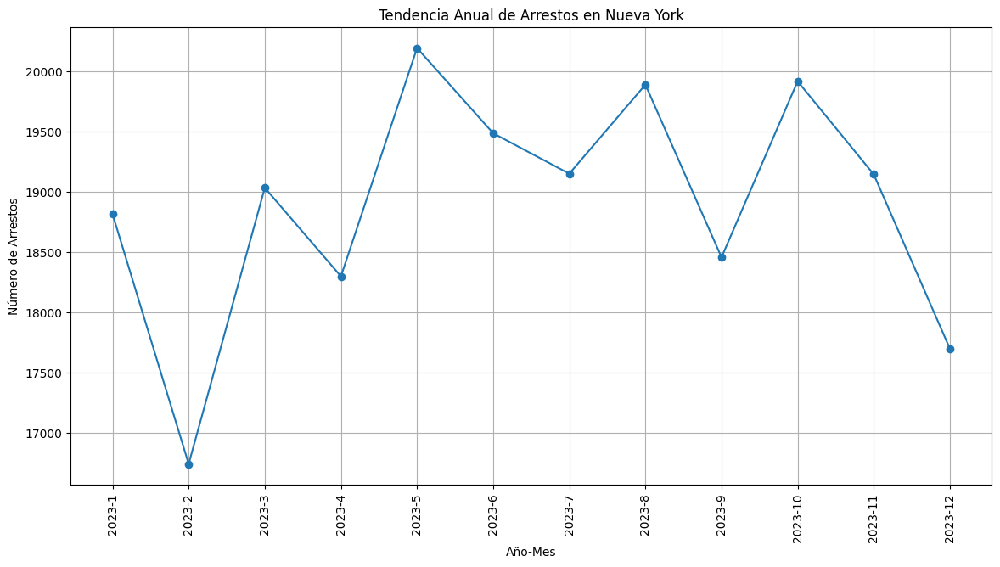

In [0]:
from pyspark.sql.functions import year, month

# Crear una columna con el año y mes extraídos de la fecha de arresto
df_with_year_month = df.withColumn("Year", year("ARREST_DATE")).withColumn("Month", month("ARREST_DATE"))

# Contar arrestos por año y mes
arrests_by_year_month = df_with_year_month.groupBy("Year", "Month").count().orderBy("Year", "Month")

# Convertir a Pandas para visualización
arrests_by_year_month_pandas = arrests_by_year_month.toPandas()

# Gráfico de tendencias de arrestos por año y mes
import matplotlib.pyplot as plt
plt.figure(figsize=(14, 7))
plt.plot(arrests_by_year_month_pandas['Year'].astype(str) + '-' + arrests_by_year_month_pandas['Month'].astype(str), arrests_by_year_month_pandas['count'], marker='o')
plt.xticks(rotation=90)
plt.title('Tendencia Anual de Arrestos en Nueva York')
plt.xlabel('Año-Mes')
plt.ylabel('Número de Arrestos')
plt.grid(True)
plt.show()

<h1>Pregunta 2:</h1>
<p>¿Cómo se distribuyen los arrestos entre los diferentes delitos (delitos mayores, delitos
menores, infracciones) y cómo ha evolucionado esta distribución en los últimos años?</p>

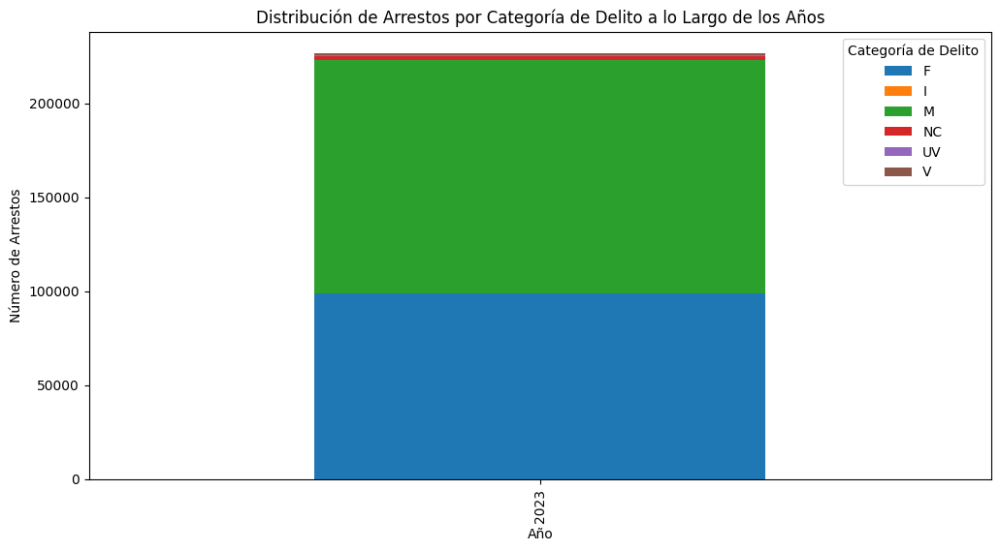

In [0]:
# Agrupar por año y categoría de delito
arrests_by_category = df_with_year_month.groupBy("Year", "LAW_CAT_CD").count().orderBy("Year", "LAW_CAT_CD")

# Visualización
arrests_by_category_pandas = arrests_by_category.toPandas()
arrests_by_category_pandas.pivot(index='Year', columns='LAW_CAT_CD', values='count').plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Distribución de Arrestos por Categoría de Delito a lo Largo de los Años')
plt.xlabel('Año')
plt.ylabel('Número de Arrestos')
plt.legend(title='Categoría de Delito')
plt.show()

<h1>Pregunta 3:</h1>
<p>¿Cuáles son los tipos de delitos más comunes en cada barrio de Nueva York y cómo se
compara esto con el promedio de la ciudad?
</p>

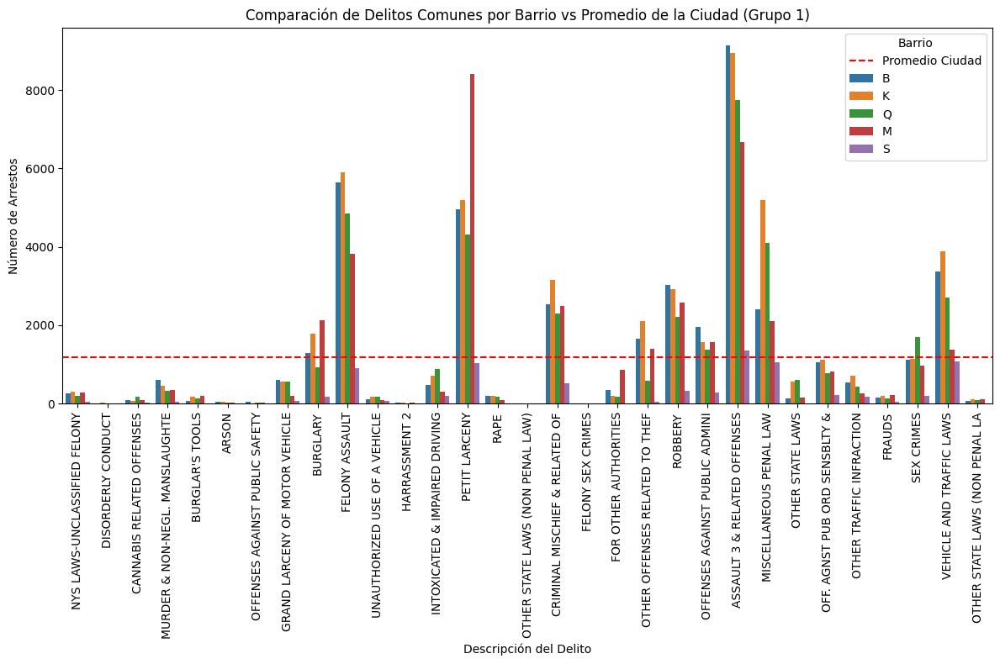

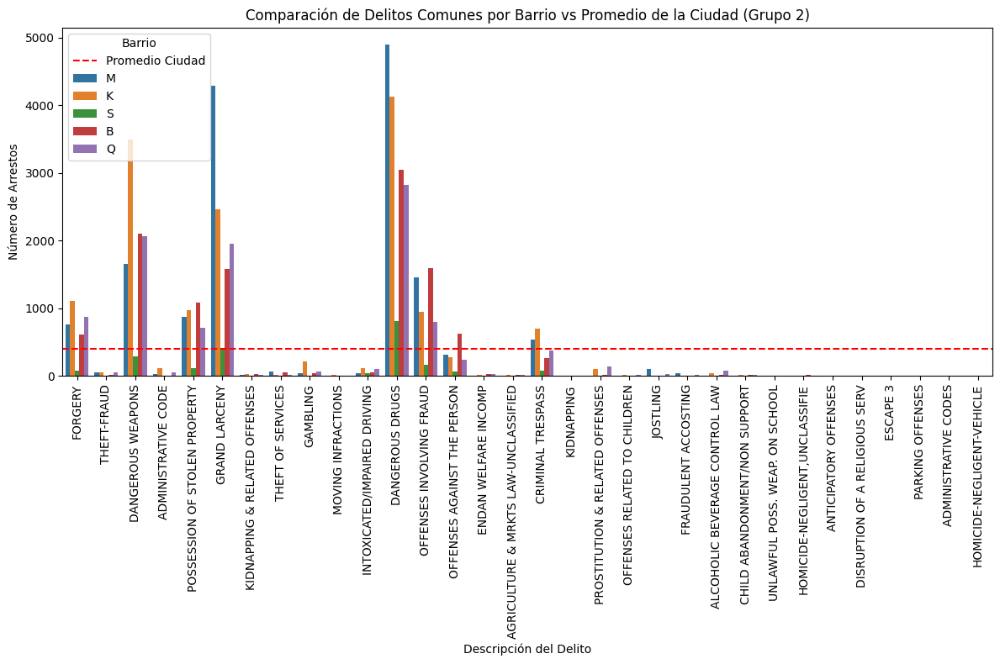

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

# Convertir a Pandas DataFrame para visualización
arrests_comparison_pandas = arrests_comparison.toPandas()

# Lista de delitos para dividir en dos grupos
half_index = len(arrests_comparison_pandas['OFNS_DESC'].unique()) // 2
first_half_delitos = arrests_comparison_pandas['OFNS_DESC'].unique()[:half_index]
second_half_delitos = arrests_comparison_pandas['OFNS_DESC'].unique()[half_index:]

# Filtrar el DataFrame para el primer grupo de delitos
first_half_data = arrests_comparison_pandas[arrests_comparison_pandas['OFNS_DESC'].isin(first_half_delitos)]

# Filtrar el DataFrame para el segundo grupo de delitos
second_half_data = arrests_comparison_pandas[arrests_comparison_pandas['OFNS_DESC'].isin(second_half_delitos)]

# Visualización para el primer grupo de delitos
plt.figure(figsize=(12, 8))
sns.barplot(x="OFNS_DESC", y="boro_count", hue="ARREST_BORO", data=first_half_data)
plt.axhline(y=first_half_data['city_avg'].mean(), color='r', linestyle='--', label='Promedio Ciudad')
plt.xticks(rotation=90)  # Cambiado a 90 grados para texto vertical
plt.title('Comparación de Delitos Comunes por Barrio vs Promedio de la Ciudad (Grupo 1)')
plt.xlabel('Descripción del Delito')
plt.ylabel('Número de Arrestos')
plt.legend(title='Barrio')
plt.tight_layout()
plt.show()

# Visualización para el segundo grupo de delitos
plt.figure(figsize=(12, 8))
sns.barplot(x="OFNS_DESC", y="boro_count", hue="ARREST_BORO", data=second_half_data)
plt.axhline(y=second_half_data['city_avg'].mean(), color='r', linestyle='--', label='Promedio Ciudad')
plt.xticks(rotation=90)  # Cambiado a 90 grados para texto vertical
plt.title('Comparación de Delitos Comunes por Barrio vs Promedio de la Ciudad (Grupo 2)')
plt.xlabel('Descripción del Delito')
plt.ylabel('Número de Arrestos')
plt.legend(title='Barrio')
plt.tight_layout()
plt.show()

<h1>Pregunta 4:</h1>
<p>¿Hay alguna correlación entre la edad o el sexo del perpetrador y el tipo de delito
cometido?</p>

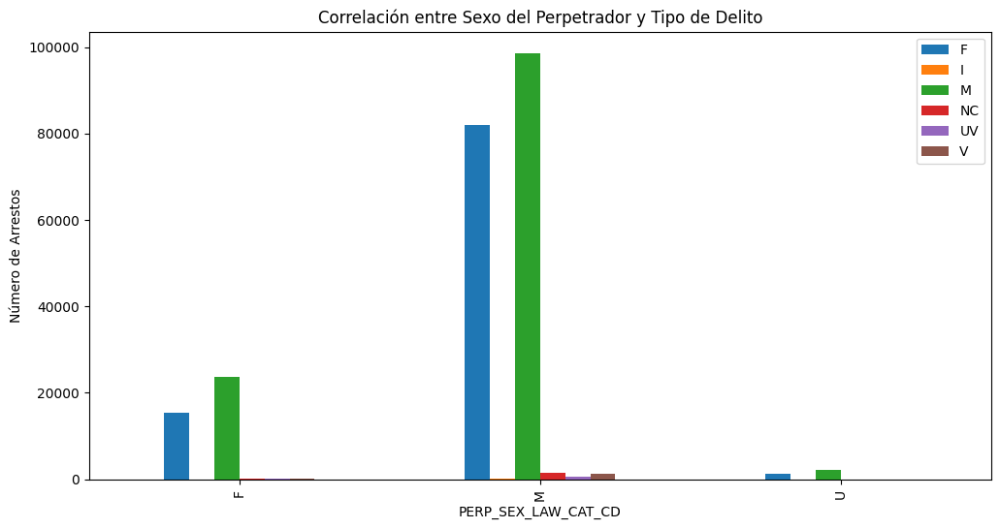

In [0]:
# Tabla de contingencia entre sexo del perpetrador y tipo de delito
contingency_table = df.stat.crosstab("PERP_SEX", "LAW_CAT_CD")

# Visualización de la tabla de contingencia
contingency_table_pandas = contingency_table.toPandas()
contingency_table_pandas.set_index('PERP_SEX_LAW_CAT_CD', inplace=True)
contingency_table_pandas.plot(kind='bar', figsize=(12, 6))
plt.title('Correlación entre Sexo del Perpetrador y Tipo de Delito')
plt.ylabel('Número de Arrestos')
plt.show()


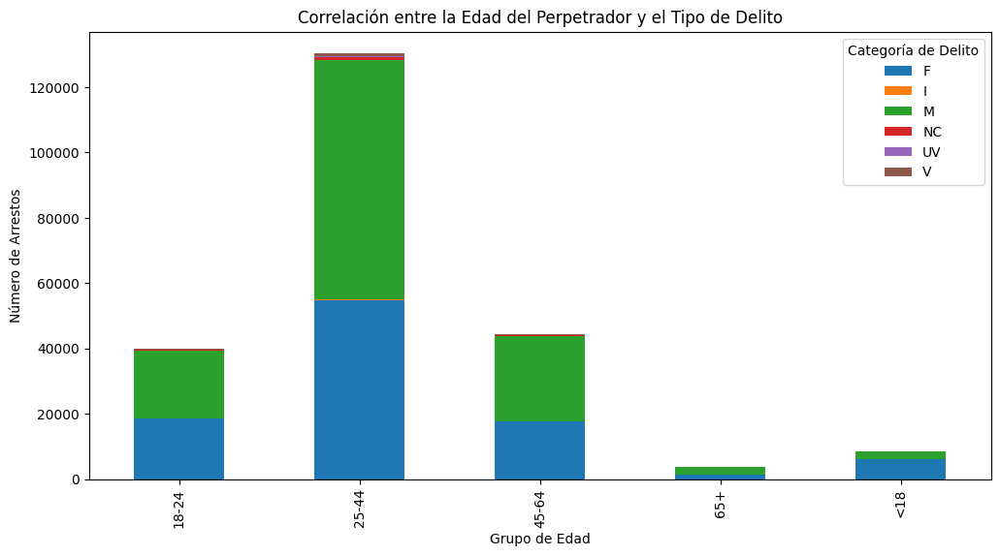

In [0]:
# Agrupar por grupo de edad y tipo de delito
arrests_by_age_delito = df.groupBy("AGE_GROUP", "LAW_CAT_CD").count()

# Visualización
arrests_by_age_delito_pandas = arrests_by_age_delito.toPandas()
arrests_by_age_delito_pandas.pivot(index='AGE_GROUP', columns='LAW_CAT_CD', values='count').plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Correlación entre la Edad del Perpetrador y el Tipo de Delito')
plt.xlabel('Grupo de Edad')
plt.ylabel('Número de Arrestos')
plt.legend(title='Categoría de Delito')
plt.show()


<h1>Pregunta 5:</h1>
<p>¿Cómo varían los arrestos entre los distintos precincts y cuáles presentan la mayor y
menor cantidad de arrestos?</p>

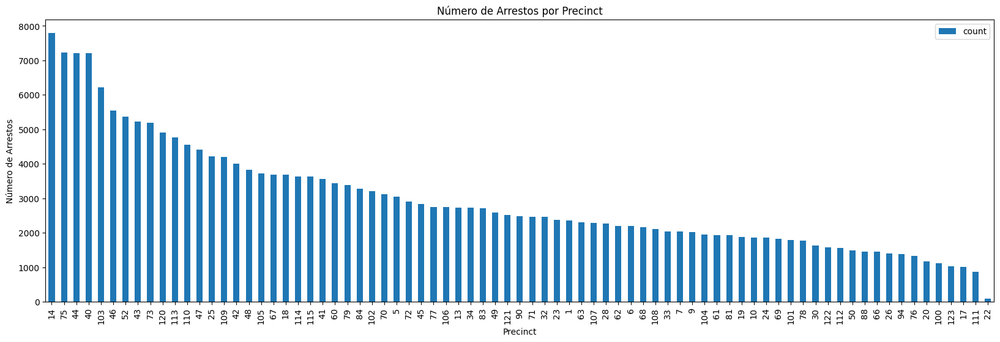

In [0]:
# Contar arrestos por precinct
arrests_by_precinct = df.groupBy("ARREST_PRECINCT").count().orderBy(col("count").desc())

# Mostrar el precinct con más arrestos y el que menos tiene
max_arrests_precinct = arrests_by_precinct.first()
min_arrests_precinct = arrests_by_precinct.orderBy(col("count").asc()).first()

# Visualización de arrestos por precinct
arrests_by_precinct_pandas = arrests_by_precinct.toPandas()
arrests_by_precinct_pandas.plot(kind='bar', x='ARREST_PRECINCT', y='count', figsize=(20, 6))
plt.title('Número de Arrestos por Precinct')
plt.xlabel('Precinct')
plt.ylabel('Número de Arrestos')
plt.show()

<h1>Pregunta 6:</h1>
<p>¿Cuál es el impacto de las jurisdicciones no-NYPD en los arrestos y cómo se
distribuyen estos arrestos por tipo de delito?
</p>

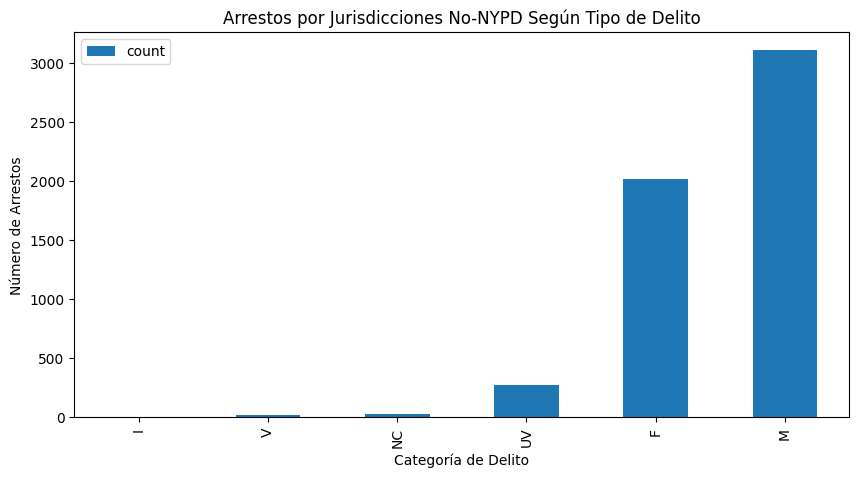

In [0]:
# Filtrar arrestos hechos por jurisdicciones no-NYPD
non_nypd_arrests = df.filter(df["JURISDICTION_CODE"] > 2)

# Contar arrestos no-NYPD por tipo de delito
non_nypd_arrests_by_type = non_nypd_arrests.groupBy("LAW_CAT_CD").count().orderBy("count")

# Visualización
non_nypd_arrests_by_type_pandas = non_nypd_arrests_by_type.toPandas()
non_nypd_arrests_by_type_pandas.plot(kind='bar', x='LAW_CAT_CD', y='count', figsize=(10, 5))
plt.title('Arrestos por Jurisdicciones No-NYPD Según Tipo de Delito')
plt.xlabel('Categoría de Delito')
plt.ylabel('Número de Arrestos')
plt.show()

<h1>Pregunta 7:</h1>
<p>¿Existen patrones geográficos en la ubicación de los arrestos, y cómo se relacionan
estos patrones con variables demográficas o socioeconómicas?</p>

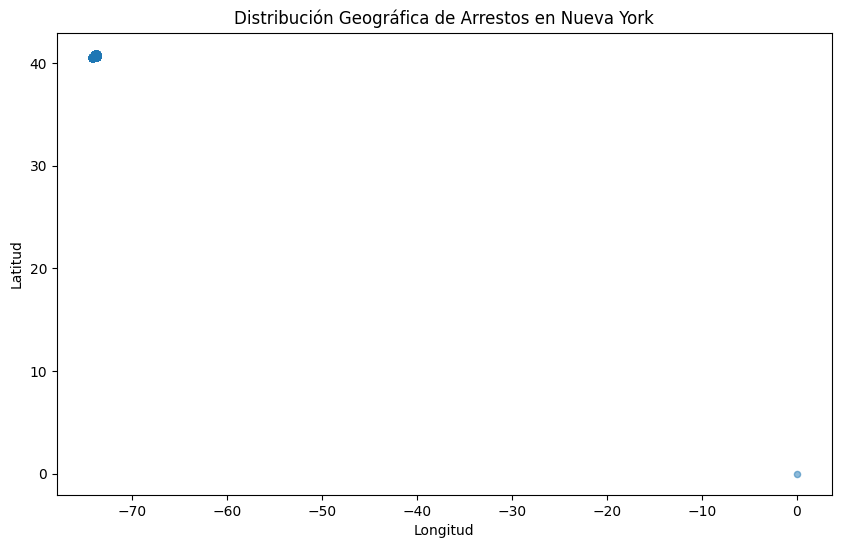

In [0]:
# Gráfico de dispersión de arrestos por ubicación geográfica
df.select("Latitude", "Longitude").toPandas().plot(kind='scatter', x='Longitude', y='Latitude', alpha=0.5, figsize=(10, 6))
plt.title('Distribución Geográfica de Arrestos en Nueva York')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.show()

# Nota: Para la relación con variables demográficas o socioeconómicas, se necesitarían datos adicionales.


<h1>Pregunta 8:</h1>
<p>¿Cuáles son las 5 zonas con mayor cantidad de arrestos en Nueva York?</p>

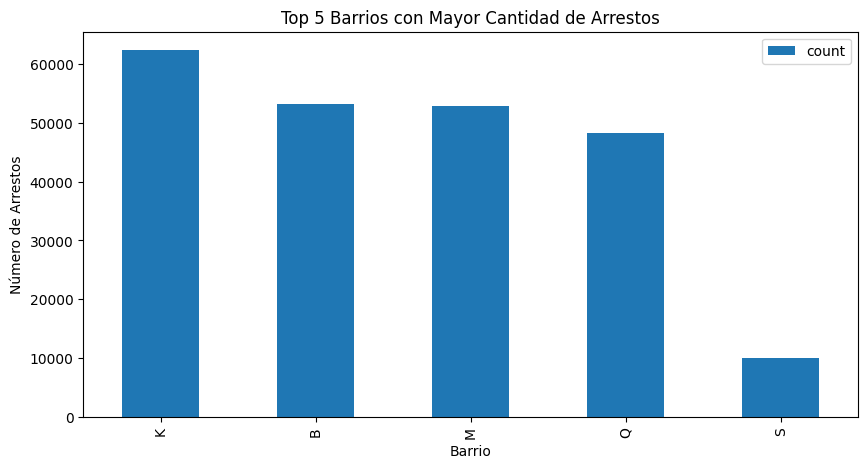

In [0]:
# Contar arrestos por barrio
arrests_by_boro = df.groupBy("ARREST_BORO").count().orderBy(col("count").desc())

# Mostrar los 5 barrios con más arrestos
top_boros = arrests_by_boro.limit(5)

# Visualización
top_boros_pandas = top_boros.toPandas()
top_boros_pandas.plot(kind='bar', x='ARREST_BORO', y='count', figsize=(10, 5))
plt.title('Top 5 Barrios con Mayor Cantidad de Arrestos')
plt.xlabel('Barrio')
plt.ylabel('Número de Arrestos')
plt.show()


<h2>**Modelo Supervisado**: Regresión Logística.</h2>

In [0]:
###70% Entrenamiento 30% Testeo
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.classification import LogisticRegression
from pyspark.ml import Pipeline

# Asegúrate de que solo se utilizan columnas numéricas en el VectorAssembler
assembler = VectorAssembler(
    inputCols=["LAW_CAT_CDInd", "ARREST_BOROInd", "ARREST_PRECINCTInd", "AGE_GROUPInd", "PERP_SEXInd", "PERP_RACEInd", "Latitude", "Longitude", "Month"],
    outputCol="features")

# Configura la regresión logística
lr = LogisticRegression(featuresCol="features", labelCol="LAW_CAT_CDInd", maxIter=10)

# Configura el pipeline
pipeline = Pipeline(stages=[assembler, lr])

# Dividir los datos
train_data, test_data = df.randomSplit([0.7, 0.3], seed=42)

# Entrenar el modelo
model = pipeline.fit(train_data)

# Predecir
predictions = model.transform(test_data)
predictions.select("features", "LAW_CAT_CDInd", "prediction").show(5)


+--------------------+-------------+----------+
|            features|LAW_CAT_CDInd|prediction|
+--------------------+-------------+----------+
|[1.0,0.0,24.0,0.0...|          1.0|       1.0|
|[1.0,0.0,69.0,0.0...|          1.0|       1.0|
|[0.0,2.0,47.0,2.0...|          0.0|       0.0|
|[0.0,2.0,47.0,1.0...|          0.0|       0.0|
|[1.0,2.0,0.0,2.0,...|          1.0|       1.0|
+--------------------+-------------+----------+
only showing top 5 rows



<h1>Evaluación y Métricas modelo supervisado</h1>

In [0]:
# Usar MulticlassClassificationEvaluator para métricas relevantes
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Evaluador para la precisión
evaluator_accuracy = MulticlassClassificationEvaluator(labelCol="LAW_CAT_CDInd", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator_accuracy.evaluate(predictions)
print(f"Precisión: {accuracy}")

# Evaluador para el F1 Score
evaluator_f1 = MulticlassClassificationEvaluator(labelCol="LAW_CAT_CDInd", predictionCol="prediction", metricName="f1")
f1_score = evaluator_f1.evaluate(predictions)
print(f"F1 Score: {f1_score}")

# Matriz de confusión
confusion_matrix = predictions.groupBy("LAW_CAT_CDInd").pivot("prediction").count()  # Asegúrate de ajustar los valores de pivot según las clases que tengas
confusion_matrix.show()


Precisión: 0.9917359024217783
F1 Score: 0.9895987049401818
+-------------+-----+-----+----+----+----+
|LAW_CAT_CDInd|  0.0|  1.0| 2.0| 3.0| 4.0|
+-------------+-----+-----+----+----+----+
|          0.0|37360| NULL|NULL|NULL|NULL|
|          1.0| NULL|29409|NULL|NULL|NULL|
|          4.0| NULL| NULL|   1|   5| 161|
|          3.0| NULL| NULL|  54| 302|  50|
|          2.0| NULL|  367|  91|   9|   8|
|          5.0| NULL| NULL|   6|  46|  15|
+-------------+-----+-----+----+----+----+



<h1>Segunda prueba modelo supervisado</h1>

In [0]:
###60% Entrenamiento 40% Testeo
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.classification import LogisticRegression
from pyspark.ml import Pipeline

# Asegúrate de que solo se utilizan columnas numéricas en el VectorAssembler
assembler = VectorAssembler(
    inputCols=["LAW_CAT_CDInd", "ARREST_BOROInd", "ARREST_PRECINCTInd", "AGE_GROUPInd", "PERP_SEXInd", "PERP_RACEInd", "Latitude", "Longitude", "Month"],
    outputCol="features")

# Configura la regresión logística
lr = LogisticRegression(featuresCol="features", labelCol="LAW_CAT_CDInd", maxIter=10)

# Configura el pipeline
pipeline = Pipeline(stages=[assembler, lr])

# Dividir los datos
train_data2, test_data2 = df.randomSplit([0.8, 0.2], seed=4321)

# Entrenar el modelo
model = pipeline.fit(train_data2)

# Predecir
predictions2 = model.transform(test_data2)
predictions2.select("features", "LAW_CAT_CDInd", "prediction").show(5)


+--------------------+-------------+----------+
|            features|LAW_CAT_CDInd|prediction|
+--------------------+-------------+----------+
|[1.0,0.0,24.0,0.0...|          1.0|       1.0|
|[1.0,0.0,31.0,2.0...|          1.0|       1.0|
|[1.0,0.0,69.0,0.0...|          1.0|       1.0|
|[0.0,3.0,21.0,0.0...|          0.0|       0.0|
|[0.0,0.0,67.0,2.0...|          0.0|       0.0|
+--------------------+-------------+----------+
only showing top 5 rows



In [0]:
# Usar MulticlassClassificationEvaluator para métricas relevantes
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Evaluador para la precisión
evaluator_accuracy = MulticlassClassificationEvaluator(labelCol="LAW_CAT_CDInd", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator_accuracy.evaluate(predictions2)
print(f"Precisión: {accuracy}")

# Evaluador para el F1 Score
evaluator_f1 = MulticlassClassificationEvaluator(labelCol="LAW_CAT_CDInd", predictionCol="prediction", metricName="f1")
f1_score = evaluator_f1.evaluate(predictions2)
print(f"F1 Score: {f1_score}")

# Matriz de confusión
confusion_matrix = predictions.groupBy("LAW_CAT_CDInd").pivot("prediction").count()  # Asegúrate de ajustar los valores de pivot según las clases que tengas
confusion_matrix.show()


Precisión: 0.9907417612697013
F1 Score: 0.9873742569860703
+-------------+-----+-----+----+----+----+
|LAW_CAT_CDInd|  0.0|  1.0| 2.0| 3.0| 4.0|
+-------------+-----+-----+----+----+----+
|          0.0|37360| NULL|NULL|NULL|NULL|
|          1.0| NULL|29409|NULL|NULL|NULL|
|          4.0| NULL| NULL|   1|   5| 161|
|          3.0| NULL| NULL|  54| 302|  50|
|          2.0| NULL|  367|  91|   9|   8|
|          5.0| NULL| NULL|   6|  46|  15|
+-------------+-----+-----+----+----+----+



<h1>Modelo no Supervisado: K-Means Clustering</h1>

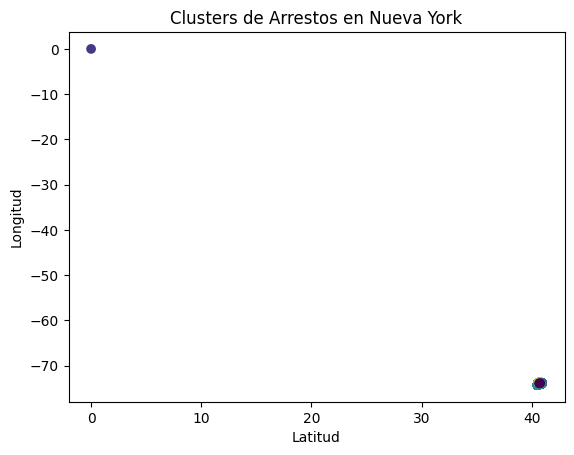

In [0]:
###K = 7 Seed = 1
from pyspark.ml.clustering import KMeans
from pyspark.ml.feature import VectorAssembler

# Asamblea de características para el clustering
assembler = VectorAssembler(
    inputCols=["Latitude", "Longitude"],
    outputCol="features")

# Configurar K-Means
kmeans = KMeans().setK(7).setSeed(1).setFeaturesCol("features")

# Crear el Pipeline
pipeline = Pipeline(stages=[assembler, kmeans])

# Ajustar el modelo
model = pipeline.fit(df)

# Transformar los datos
clusters = model.transform(df)

# Visualizar los resultados del clustering
import matplotlib.pyplot as plt
import pandas as pd

pandas_df = clusters.toPandas()
plt.scatter(pandas_df['Latitude'], pandas_df['Longitude'], c=pandas_df['prediction'])
plt.title('Clusters de Arrestos en Nueva York')
plt.xlabel('Latitud')
plt.ylabel('Longitud')
plt.show()


<h1>Evaluación y Métricas modelo no supervisado</h1>

In [0]:
from pyspark.ml.evaluation import ClusteringEvaluator

# Instanciar un evaluador de clustering
evaluator = ClusteringEvaluator()

# Evaluar el modelo y calcular el Silhouette score
silhouette = evaluator.evaluate(clusters)
print(f"Silhouette con distancia euclidiana cuadrada: {silhouette}")

# Mostrar los centros de los clusters
centers = model.stages[-1].clusterCenters()
print("Cluster Centers: ")
for center in centers:
    print(center)


Silhouette con distancia euclidiana cuadrada: 0.643644647567269
Cluster Centers: 
[ 40.6957667  -73.90074323]
[0. 0.]
[ 40.8347202  -73.90335329]
[ 40.61131624 -74.11797116]
[ 40.74023895 -73.98131766]
[ 40.69812298 -73.79458144]
[ 40.63305287 -73.97428319]


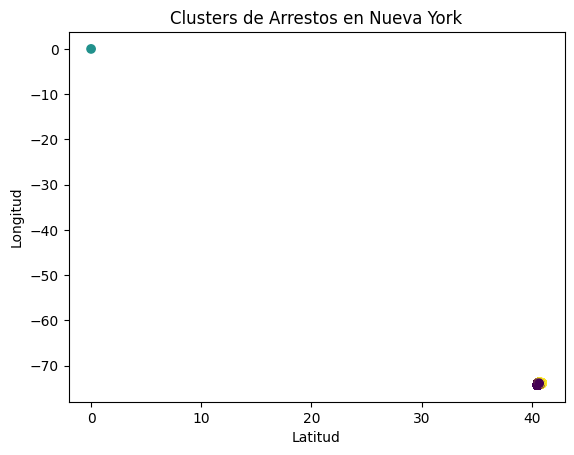

In [0]:
###K = 3 Seed = 4321
from pyspark.ml.clustering import KMeans
from pyspark.ml.feature import VectorAssembler

# Asamblea de características para el clustering
assembler = VectorAssembler(
    inputCols=["Latitude", "Longitude"],
    outputCol="features")

# Configurar K-Means
kmeans = KMeans().setK(3).setSeed(4321).setFeaturesCol("features")

# Crear el Pipeline
pipeline = Pipeline(stages=[assembler, kmeans])

# Ajustar el modelo
model = pipeline.fit(df)

# Transformar los datos
clusters = model.transform(df)

# Visualizar los resultados del clustering
import matplotlib.pyplot as plt
import pandas as pd

pandas_df = clusters.toPandas()
plt.scatter(pandas_df['Latitude'], pandas_df['Longitude'], c=pandas_df['prediction'])
plt.title('Clusters de Arrestos en Nueva York')
plt.xlabel('Latitud')
plt.ylabel('Longitud')
plt.show()


In [0]:
from pyspark.ml.evaluation import ClusteringEvaluator

# Instanciar un evaluador de clustering
evaluator = ClusteringEvaluator()

# Evaluar el modelo y calcular el Silhouette score
silhouette = evaluator.evaluate(clusters)
print(f"Silhouette con distancia euclidiana cuadrada: {silhouette}")

# Mostrar los centros de los clusters
centers = model.stages[-1].clusterCenters()
print("Cluster Centers: ")
for center in centers:
    print(center)


Silhouette con distancia euclidiana cuadrada: 0.5721958052192962
Cluster Centers: 
[ 40.67838345 -73.97274938]
[0. 0.]
[ 40.79177456 -73.87722044]


<h1>Bono:</h1>
<p>Desarrollo de una red neuronal (Aprendizaje Profundo)</p>

In [0]:
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.feature import StringIndexer

# Si tienes columnas categóricas, necesitas convertirlas a numéricas
indexers = [StringIndexer(inputCol=column, outputCol=column+"_index").fit(df) for column in ["PERP_SEX", "PERP_RACE", "ARREST_BORO", "LAW_CAT_CD"]]

# Aplicar los indexadores y añadir una columna de características
pipeline = Pipeline(stages=indexers)
df_r = pipeline.fit(df).transform(df)

assembler = VectorAssembler(inputCols=["PERP_SEX_index", "PERP_RACE_index", "ARREST_BORO_index", "Latitude", "Longitude"], outputCol="features")
df_r = assembler.transform(df_r)

# Asegúrate de que la columna de etiquetas es numérica y está indexada si es categórica
labelIndexer = StringIndexer(inputCol="LAW_CAT_CD", outputCol="label").fit(df_r)
df_r = labelIndexer.transform(df_r)


In [0]:
from pyspark.ml.classification import MultilayerPerceptronClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

# Dividir los datos en conjuntos de entrenamiento y prueba
train_data, test_data = df_r.randomSplit([0.8, 0.2], seed=4321)

# Especificar las capas de la red neuronal
# Número de entradas (features), dos capas ocultas de tamaños 20 y 15, y el número de clases de salida
layers = [5, 20, 15, len(labelIndexer.labels)]

# Crear el clasificador
nn = MultilayerPerceptronClassifier(layers=layers, blockSize=256, seed=1234, maxIter=200, featuresCol="features", labelCol="label")

# Entrenar el modelo
model = nn.fit(train_data)

# Predecir
predictions = model.transform(test_data)

<h1>Evaluación de la Red Neuronal</h1>

In [0]:
# Evaluador para la precisión
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(predictions)
print("Precisión: {:.2f}".format(accuracy))

# Evaluador para el F1 Score
evaluator_f1 = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="f1")
f1_score = evaluator_f1.evaluate(predictions)
print("F1 Score: {:.2f}".format(f1_score))

# Matriz de confusión
confusion_matrix = predictions.groupBy("label").pivot("prediction").count()
confusion_matrix.show()


Precisión: 0.55
F1 Score: 0.46
+-----+-----+----+
|label|  0.0| 1.0|
+-----+-----+----+
|  0.0|22415|2491|
|  1.0|17268|2440|
|  4.0|  116|NULL|
|  3.0|  199|  67|
|  2.0|  306|  16|
|  5.0|   43|   4|
+-----+-----+----+

